In [636]:
import geopandas as gpd
import pandas as pd

from gensim.matutils import corpus2csc
from gensim.corpora import Dictionary
from gensim.models import Word2Vec
from gensim.models.fasttext import FastText

import pickle

from importlib import reload
import ppmi_svd
from translator import translator

import matplotlib.pyplot as plt
import matplotlib.patches as patches



import nltk
import json
import requests
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [85]:
# global parameters for plots
plt.style.use("fast")
plt.rcParams['figure.dpi'] = 600
plt.rcParams['figure.figsize'] = (4.45, 3)
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['font.size'] = 8

def save_figure(fig, fig_name):
    fig.savefig("../figures/" + fig_name + ".tiff", dpi=600)
    fig.savefig("../figures/" + fig_name + ".png", dpi=600)

In [3]:
GIST = gpd.read_parquet("../data/large_files/GIST_geocontexts.parquet")
len(GIST)

106898

In [576]:
ids_lines = pickle.load(open("../data/ids_lines.pickle", "rb"))
freqs_tups = pickle.load(open("../data/freqs_tups.pickle", "rb"))

In [577]:
religion_final = ["θεός", "Ζεύς", "εὐσεβής", 'ἱερός']
morality_final = ["ἀγαθός", "ἀρετή", "δίκαιος", "τιμή"]

In [88]:
N_types_covered = 1000
vocab = [tup[0] for tup in freqs_tups[:N_types_covered]]
dictionary = Dictionary([vocab])

In [89]:
dictionary.doc2bow(["θεός", "θεός","Ζεύς", "nonexistent", "εὐσέβεια", 'ἱερεύς', "θυσία"])

[(35, 1), (293, 2), (299, 1), (931, 1)]

In [90]:
dictionary[293]

'θεός'

# samples and idslists

In [682]:
cent_ids_samples = {}
for cent in range(-6, 4):
    if cent < 0:
        cent_start, cent_end = cent * 100, cent * 100 + 99
    else:
        cent_start, cent_end = cent * 100 + 1, cent * 100 + 100
    subset_ids = GIST[GIST["random_dates"].apply(lambda x: cent_start < x[0] < cent_end)]["PHI_ID"]
    subset_sample_ids = subset_ids.sample(5000, replace=True)
    cent_ids_samples[cent] = subset_sample_ids

In [683]:
# full_model
ids_list = []
for cent in cent_ids_samples.keys():
    ids_list.extend(list(cent_ids_samples[cent]))
ids_list = [str(id) for id in ids_list]

# PPMI-SVD

In [594]:
class NgramCorpusBows:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    if bool(line.split()):
                        bow = dictionary.doc2bow(line.split())
                        yield bow

In [130]:
ids_list = [str(id) for id in GIST["PHI_ID"]]

In [131]:
corpus = NgramCorpusBows()

In [132]:
%%time
cooc, vocabulary, pmi_matrix, keyed_vectors, pmi_svd_cos = ppmi_svd.from_bows_to_embeddings(corpus, dictionary)

CPU times: user 1min, sys: 1.55 s, total: 1min 1s
Wall time: 30.7 s


In [133]:
keyed_vectors.most_similar("θεός", topn=10)

[('πᾶς', 0.9960299730300903),
 ('ἱερός', 0.9934923052787781),
 ('ἔτος', 0.9926028251647949),
 ('ἄρχων', 0.9915057420730591),
 ('δῆμος', 0.9906384348869324),
 ('Ἀπολλωνία', 0.9904025197029114),
 ('γίγνομαι', 0.9898732900619507),
 ('ἀγαθός', 0.9889795780181885),
 ('ἀνήρ', 0.9886140823364258),
 ('ἔχω', 0.9876630902290344)]

In [98]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors, perplexity=15)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [99]:
word_color_dict = {}
for word in words:
    if word in religion_final:
        word_color_dict[word] = "darkgreen"
    elif word in morality_final:
        word_color_dict[word] = "darkred"
    else:
        word_color_dict[word] = "grey"

(0.0, 1.0, 0.0, 1.0)

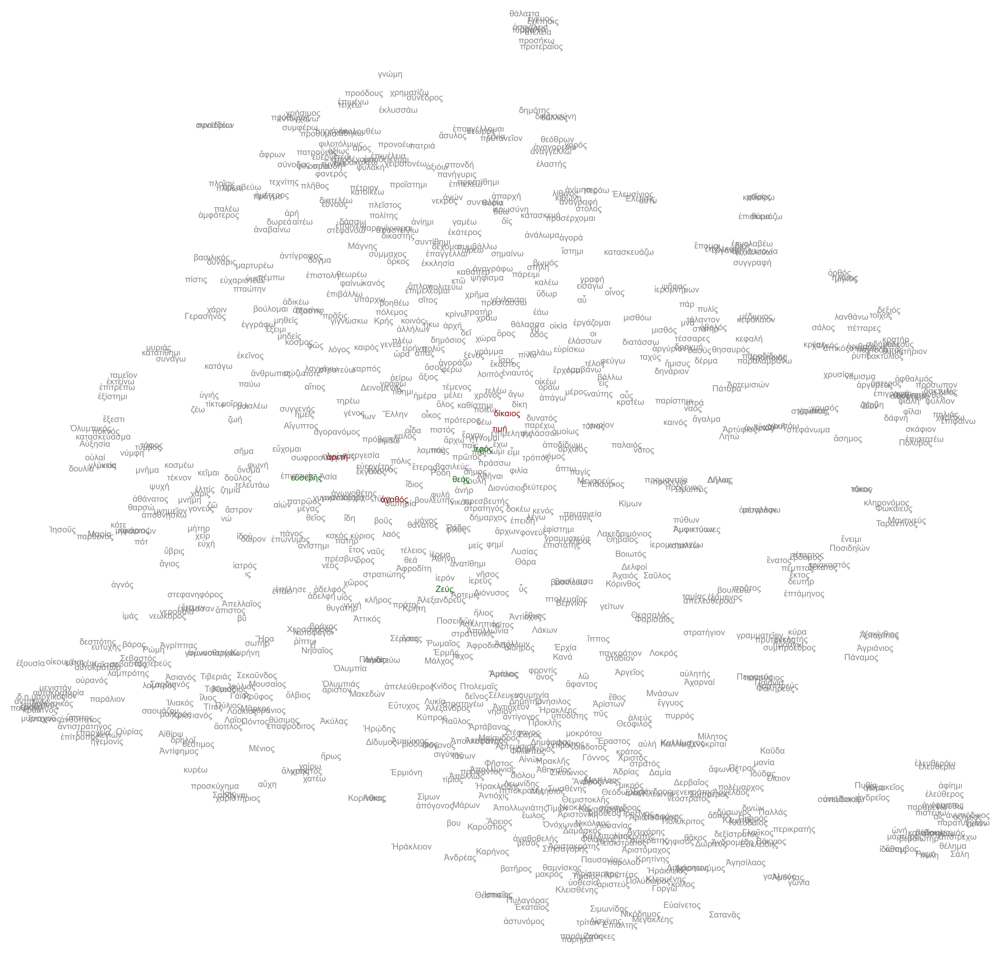

In [100]:
fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
#ax.set_facecolor("#F2F5FA")
ax.axis("off")
#ax.add_artist(ax.patch)
#ax.patch.set_zorder(-1)

In [101]:
fig.savefig("../figures/full_model_ppmisvd_large.png")

# Word2Vec

In [684]:
class NgramCorpus:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    if bool(line.split()):
                        yield line.split()

In [685]:
len(ids_list)

50000

In [686]:
ids_list = [str(id) for id in GIST["PHI_ID"]]

In [687]:
corpus = NgramCorpus()

In [688]:
corpus_len = len([doc for doc in corpus])

In [127]:
%%time
model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8)
model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
model.train(corpus, total_examples=corpus_len, epochs=model.epochs)

CPU times: user 1min 11s, sys: 1.45 s, total: 1min 13s
Wall time: 46.2 s


(35828189, 67746680)

In [128]:
keyed_vectors_w2v = model.wv

In [731]:
keyed_vectors_w2v.most_similar("Ζεύς")
theos_words = [tup[0] for tup in keyed_vectors_w2v.most_similar("θεός")]
theos_sims = [np.round(tup[1], 2) for tup in keyed_vectors_w2v.most_similar("θεός")]
zeus_words = [tup[0] for tup in keyed_vectors_w2v.most_similar("Ζεύς")]
zeus_sims = [np.round(tup[1], 2) for tup in keyed_vectors_w2v.most_similar("Ζεύς")]

sims_theos_zeus = pd.DataFrame({"θεός NN": theos_words, "θεός similarity" : theos_sims, "Ζεύς NN" : zeus_words, "Ζεύς similarity" : zeus_sims})
sims_theos_zeus

,θεός NN,θεός similarity,Ζεύς NN,Ζεύς similarity
0,βασιλεύς,0.42,Ἀθήνη,0.48
1,θεά,0.42,Ἀσκληπιός,0.40
2,ἱερός,0.41,θεός,0.38
3,πᾶς,0.41,χαριστήριος,0.36
4,πόλις,0.38,Πολιάς,0.36
5,Ζεύς,0.38,Ἄρτεμις,0.34
6,εὐσεβής,0.38,ἱερεύς,0.34
7,θεῖος,0.36,Ἀπόλλων,0.34
8,πατήρ,0.36,ἱέρεια,0.34
9,ἔχω,0.35,ὄϊς,0.33


In [733]:
sims_theos_zeus.to_csv("../data/sims_theos_zeus.csv")

In [108]:
keyed_vectors_w2v.save("../data/large_files/vectors_word2vec/full_model.wv")

In [141]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v, perplexity=15)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(0.0, 1.0, 0.0, 1.0)

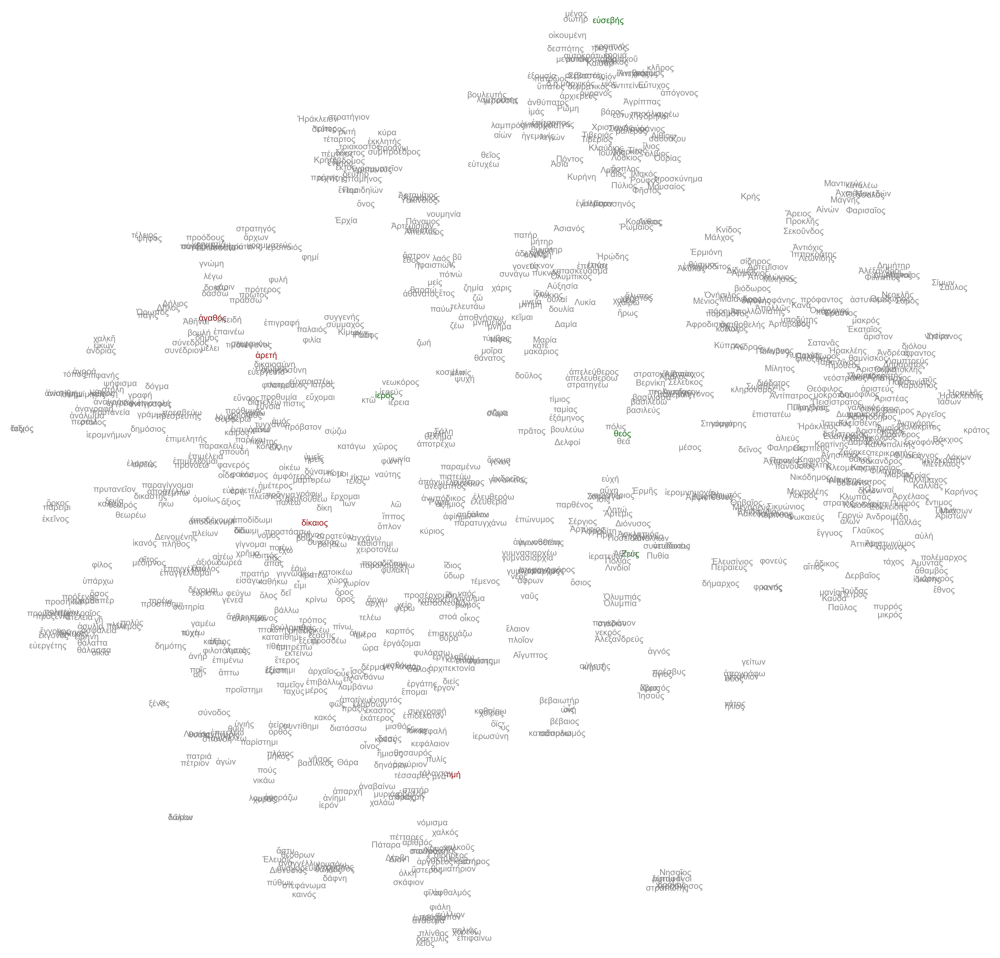

In [142]:
fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.axis("off")

In [126]:
fig.savefig("../figures/full_model_word2vec_large.png")

# Word2Vec Classical vs Rest

In [700]:
# effloresnce
ids_list = [str(id) for id in GIST[(GIST["random_dates"].apply(lambda x: x[0]).between(-450,-150)) & (GIST["greece?"])]["PHI_ID"]]
len(ids_list)

23377

In [701]:
%%time
corpus = NgramCorpus()
corpus_len = len([doc for doc in corpus])

model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8)
model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
model.train(corpus, total_examples=corpus_len, epochs=model.epochs)
keyed_vectors_w2v_rich = model.wv

CPU times: user 42.6 s, sys: 3.52 s, total: 46.1 s
Wall time: 38.6 s


In [734]:
[(tup[0], translator(tup[0]), tup[1]) for tup in keyed_vectors_w2v_rich.most_similar("θεός")]

[('ἱερός', 'super-human, mighty, divine, wonderful', 0.37944841384887695),
 ('χάρις', 'Grace', 0.35579806566238403),
 ('Ἀσκληπιός', 'Asclepius', 0.34932005405426025),
 ('καλός', 'beautiful, beauteous, fair', 0.33551663160324097),
 ('Δῆλος', 'visible', 0.31737020611763),
 ('ἐνιαυτός', 'annus', 0.31428760290145874),
 ('πᾶς', 'all, the whole', 0.3118722140789032),
 ('ποιέω', 'to make', 0.3114914298057556),
 ('θεῖος', 'of', 0.31094837188720703),
 ('ἀγαθός', 'good', 0.30761846899986267)]

(0.0, 1.0, 0.0, 1.0)

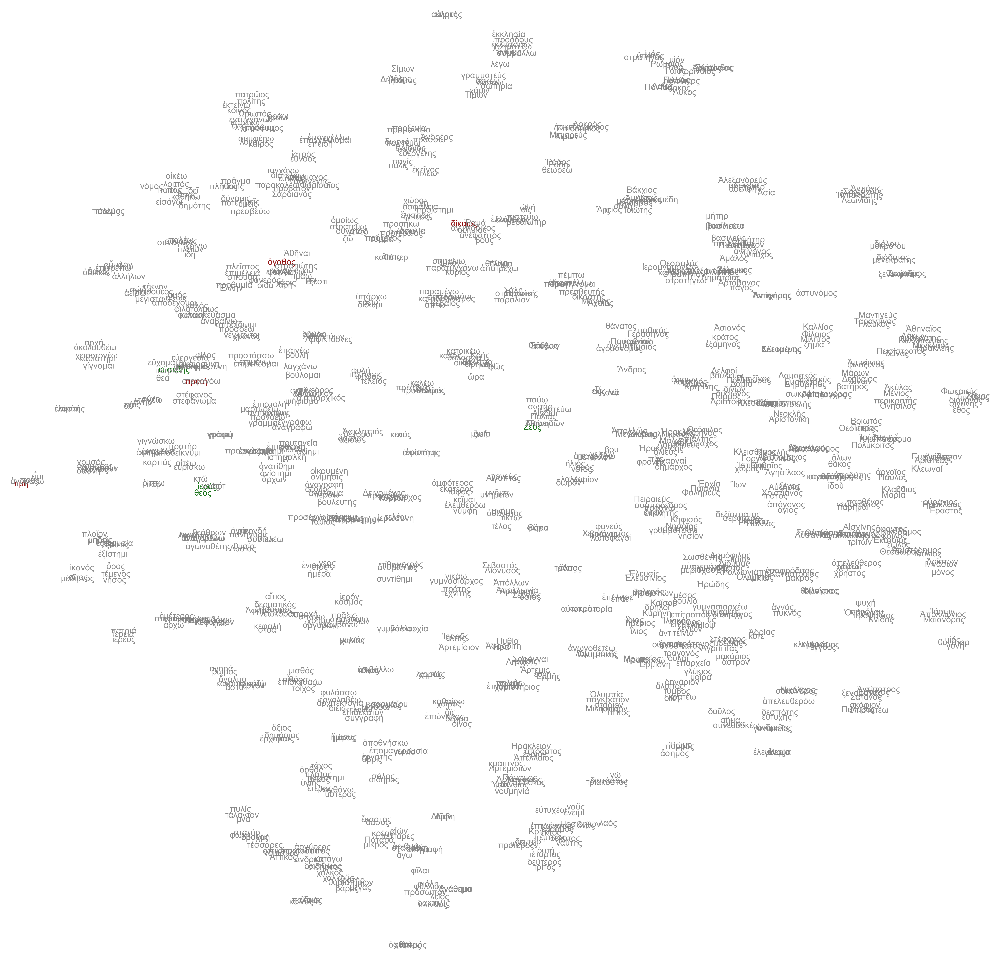

In [735]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v_rich, perplexity=3)

fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.axis("off")

In [736]:
# less afluent
ids_list = [str(id) for id in GIST[(GIST["random_dates"].apply(lambda x: x[0]).between(-150,250)) & (GIST['greece?'])]["PHI_ID"]]
len(ids_list)

20245

In [737]:
%%time
corpus = NgramCorpus()
corpus_len = len([doc for doc in corpus])

model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=4, workers=8)
model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
model.train(corpus, total_examples=corpus_len, epochs=model.epochs)
keyed_vectors_w2v_poor = model.wv

CPU times: user 20.2 s, sys: 1.52 s, total: 21.8 s
Wall time: 17.9 s


In [738]:
[(tup[0], translator(tup[0]), tup[1]) for tup in keyed_vectors_w2v_poor.most_similar("θεός")]

[('Σεβαστός', '', 0.3429745137691498),
 ('δερματικός', '', 0.34046873450279236),
 ('τραγανός', '', 0.3190831243991852),
 ('οὐρανός', 'heaven', 0.3082139790058136),
 ('παθικός', '', 0.2996031939983368),
 ('ἀπάγω', 'to lead away, carry off', 0.29687052965164185),
 ('δικαιοσύνη', 'righteousness, justice', 0.2964807450771332),
 ('μέγας', 'big, great', 0.2944677770137787),
 ('κραιπνός', 'rapid, rushing', 0.2854979932308197),
 ('ἔρουα', '', 0.2783917486667633)]

In [739]:
rich_words = [tup[0] for tup in keyed_vectors_w2v_rich.most_similar("θεός")]
rich_sims = [np.round(tup[1], 2) for tup in keyed_vectors_w2v_rich.most_similar("θεός")]
poor_words = [tup[0] for tup in keyed_vectors_w2v_poor.most_similar("θεός")]
poor_sims = [np.round(tup[1], 2) for tup in keyed_vectors_w2v_poor.most_similar("θεός")]

pd.DataFrame({"rich - θεός NN": rich_words, "rich - similarity" : rich_sims, "poor - θεός NN" : poor_words, "poor - similarity" : poor_sims})

,rich - θεός NN,rich - similarity,poor - θεός NN,poor - similarity
0,ἱερός,0.38,Σεβαστός,0.34
1,χάρις,0.36,δερματικός,0.34
2,Ἀσκληπιός,0.35,τραγανός,0.32
3,καλός,0.34,οὐρανός,0.31
4,Δῆλος,0.32,παθικός,0.30
5,ἐνιαυτός,0.31,ἀπάγω,0.30
6,πᾶς,0.31,δικαιοσύνη,0.30
7,ποιέω,0.31,μέγας,0.29
8,θεῖος,0.31,κραιπνός,0.29
9,ἀγαθός,0.31,ἔρουα,0.28


(0.0, 1.0, 0.0, 1.0)

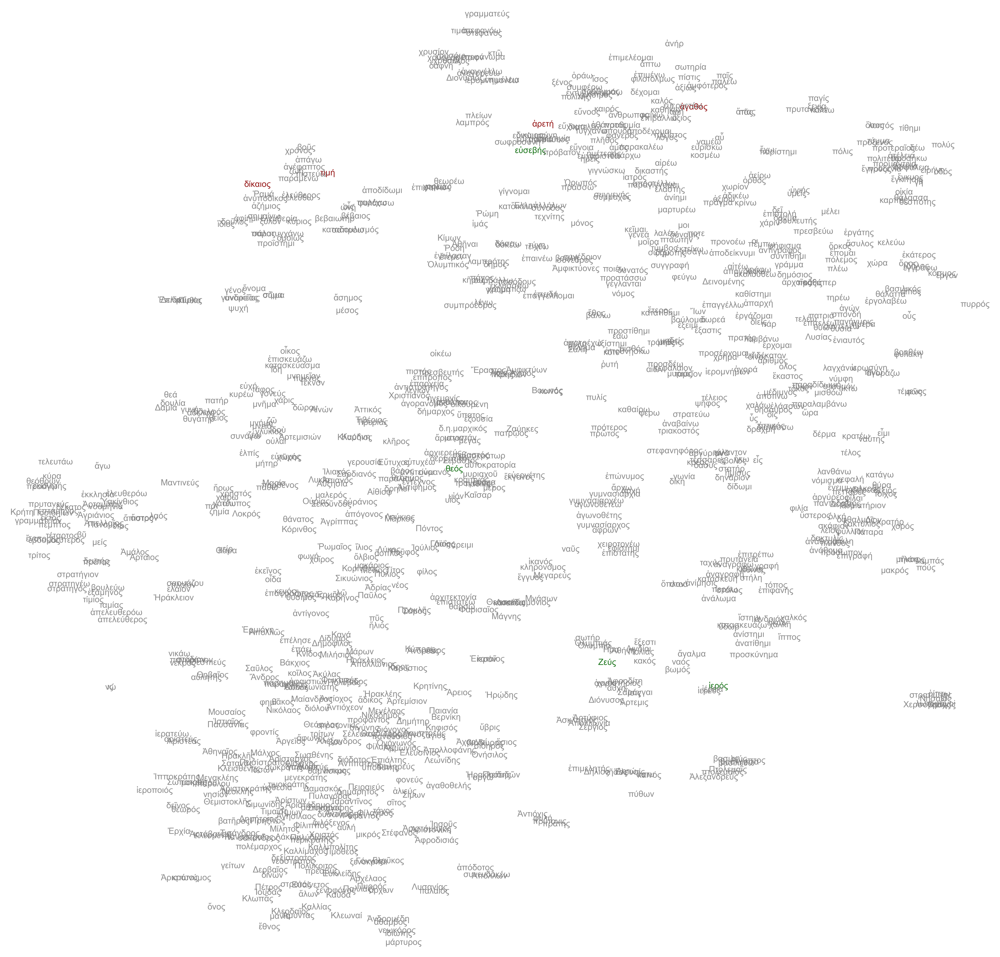

In [740]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v_poor, perplexity=10)

fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.axis("off")

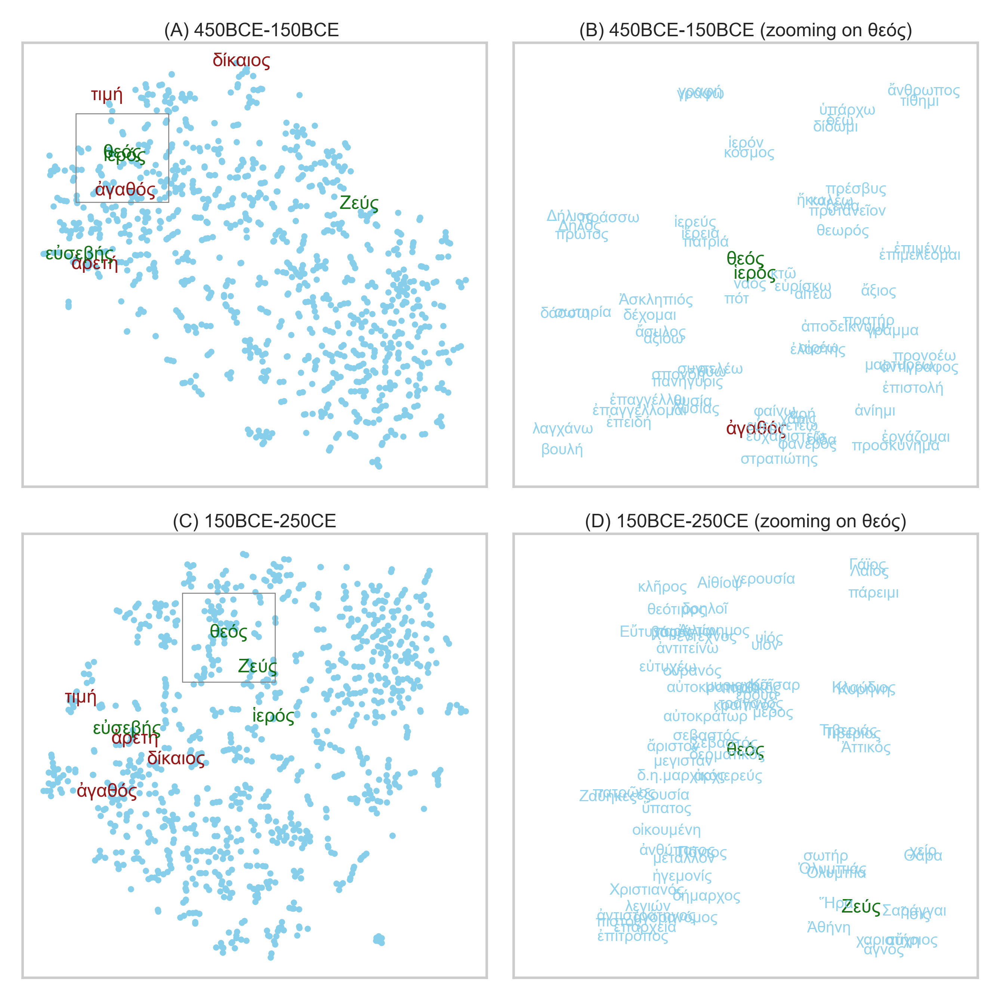

In [746]:
perplexity=7
cutoff = 0
border = 0.05
s = 1


fig, axs = plt.subplots(2,2, figsize=(4.5,4.5), dpi=600, frameon=False, tight_layout=True)


rectangle_word =religion_final[0]
redge = 0.22 # rectangle edge

ax=axs[0,0]
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v_rich, perplexity=perplexity)
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        if word in religion_final + morality_final:
            ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
        else:
            ax.scatter(x, y, s=s, color="skyblue", zorder=1) #ax.plot(x, y, color="grey")
    if word == rectangle_word:
        rect = patches.Rectangle((x - redge/2,y - redge/2), redge, redge, linewidth=0.3,edgecolor='grey',facecolor='none', zorder=2)
        ax.add_patch(rect)
        rectangle_word_xy = [x,y]
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.set_title("(A) 450BCE-150BCE ", y=1, pad=2, fontsize=6)


ax=axs[0,1]
for x, y, word in zip(xs, ys, words):
    if (rectangle_word_xy[0] + redge/2 > x > rectangle_word_xy[0] - redge/2) and (rectangle_word_xy[1] + redge/2 > y > rectangle_word_xy[1] - redge/2):
    # if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        if word in religion_final + morality_final:
            ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
        else:
            ax.text(x, y, word, horizontalalignment='center', color="skyblue", alpha=0.9, fontsize=5)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(rectangle_word_xy[0] - redge/1.6, rectangle_word_xy[0] + redge/1.6)
ax.set_ylim(rectangle_word_xy[1] - redge/1.8, rectangle_word_xy[1] + redge/1.8)
ax.set_title("(B) 450BCE-150BCE (zooming on θεός)", y=1, pad=2, fontsize=6)



xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v_poor, perplexity=perplexity)
ax=axs[1,0]
for x, y, word in zip(xs, ys, words):
    if word in religion_final + morality_final:
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
    else:
        ax.scatter(x, y, s=s, color="skyblue", zorder=1) #ax.plot(x, y, color="grey")
    if word == rectangle_word:
        rect = patches.Rectangle((x - redge/2,y - redge/2), redge, redge, linewidth=0.3,edgecolor='grey',facecolor='none', zorder=2)
        ax.add_patch(rect)
        rectangle_word_xy = [x,y]
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.set_title("(C) 150BCE-250CE", y=1, pad=2, fontsize=6)


ax=axs[1,1]
for x, y, word in zip(xs, ys, words):
    if (rectangle_word_xy[0] + redge/2 > x > rectangle_word_xy[0] - redge/2) and (rectangle_word_xy[1] + redge/2 > y > rectangle_word_xy[1] - redge/2):
        # if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        if word in religion_final + morality_final:
            ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
        else:
            ax.text(x, y, word, horizontalalignment='center', color="skyblue", alpha=0.9, fontsize=5)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(rectangle_word_xy[0] - redge/1.60, rectangle_word_xy[0] + redge/1.6)
ax.set_ylim(rectangle_word_xy[1] - redge/1.80, rectangle_word_xy[1] + redge/1.8)
ax.set_title("(D) 150BCE-250CE (zooming on θεός)", y=1, pad=2, fontsize=6)


for ax in axs.ravel():
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

In [747]:
save_figure(fig, "embeddings_rich_vs_poor")

In [748]:
sim_rich = []
for worda in religion_final:
    for wordb in morality_final:
        sim_rich.append((worda, wordb, keyed_vectors_w2v_rich.relative_cosine_similarity(worda, wordb)))

sim_poor = []
for worda in religion_final:
    for wordb in morality_final:
        sim_poor.append((worda, wordb, keyed_vectors_w2v_poor.relative_cosine_similarity(worda, wordb)))

In [749]:
sim_rich

[('θεός', 'ἀγαθός', 0.09339681058911378),
 ('θεός', 'ἀρετή', 0.07201454704705668),
 ('θεός', 'δίκαιος', 0.053641618470958496),
 ('θεός', 'τιμή', 0.06395436821980997),
 ('Ζεύς', 'ἀγαθός', 0.011267280205660325),
 ('Ζεύς', 'ἀρετή', 0.03236679045416082),
 ('Ζεύς', 'δίκαιος', -0.015265077415194483),
 ('Ζεύς', 'τιμή', 0.021761944335058483),
 ('εὐσεβής', 'ἀγαθός', 0.06964683441995269),
 ('εὐσεβής', 'ἀρετή', 0.09189298080914599),
 ('εὐσεβής', 'δίκαιος', 0.038254135915202804),
 ('εὐσεβής', 'τιμή', 0.027592588700281244),
 ('ἱερός', 'ἀγαθός', 0.04453600280285527),
 ('ἱερός', 'ἀρετή', 0.025278994600479852),
 ('ἱερός', 'δίκαιος', 0.01581136614651559),
 ('ἱερός', 'τιμή', 0.062180675499604314)]

In [750]:
coords = []
for n_lower in range(4):
    for n_upper in range(4):
        xs, ys = [n_lower, n_upper], [0,1]
        coords.append((xs, ys))
        print(xs, ys)

[0, 0] [0, 1]
[0, 1] [0, 1]
[0, 2] [0, 1]
[0, 3] [0, 1]
[1, 0] [0, 1]
[1, 1] [0, 1]
[1, 2] [0, 1]
[1, 3] [0, 1]
[2, 0] [0, 1]
[2, 1] [0, 1]
[2, 2] [0, 1]
[2, 3] [0, 1]
[3, 0] [0, 1]
[3, 1] [0, 1]
[3, 2] [0, 1]
[3, 3] [0, 1]


In [751]:
color_dict = {
    "θεός" : "tab:blue",
    "Ζεύς" : "tab:orange",
    "εὐσεβής" : "tab:green",
    "ἱερός" : "tab:red",
}

Text(0.5, 1.0, '(B) 150BCE-250CE')

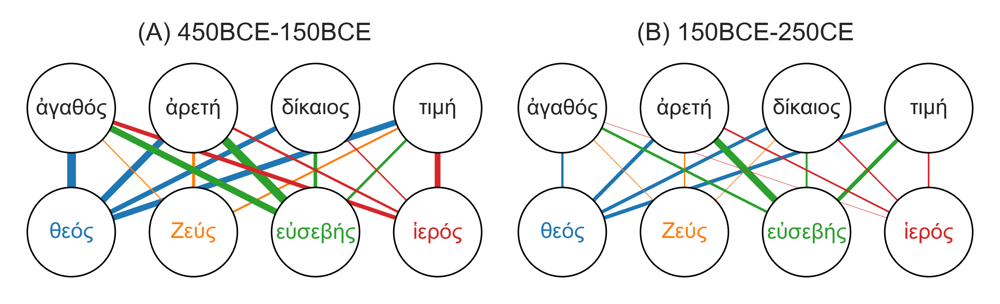

In [770]:
width_coef = 30
fig, axs = plt.subplots(1,2, figsize=(4.5, 1.4), tight_layout=True)

ax = axs[0]
for n, word in enumerate(religion_final):
    ax.text(x=n, y=0, s=word, fontsize=7, color=color_dict[word], horizontalalignment='center', verticalalignment='center')
    circle = patches.Circle(xy=(n, 0), radius=0.36, facecolor="white", linewidth=0.5, edgecolor="black", zorder=2)
    ax.add_patch(circle)
for n, word in enumerate(morality_final):
    ax.text(x=n, y=1, s=word, fontsize=7, horizontalalignment='center', verticalalignment='center')
    circle = patches.Circle(xy=(n, 1), radius=0.36, facecolor="white", linewidth=0.5, edgecolor="black", zorder=2)
    ax.add_patch(circle)

for tup, coord in zip(sim_rich, coords):
    if tup[2] > 0:
        ax.plot(coord[0], coord[1], linewidth=tup[2]*width_coef, color=color_dict[tup[0]], zorder=1)

ax.set_xlim(-0.4,3.4)
ax.set_ylim(-0.4, 1.4)
ax.axis(False)
ax.set_title("(A) 450BCE-150BCE", fontsize=8)

ax = axs[1]
for n, word in enumerate(religion_final):
    ax.text(x=n, y=0, s=word, fontsize=7, color=color_dict[word],horizontalalignment='center', verticalalignment='center')
    circle = patches.Circle(xy=(n, 0), radius=0.36, facecolor="white", linewidth=0.5, edgecolor="black", zorder=2)
    ax.add_patch(circle)
for n, word in enumerate(morality_final):
    ax.text(x=n, y=1, s=word, fontsize=7, horizontalalignment='center', verticalalignment='center')
    circle = patches.Circle(xy=(n, 1), radius=0.36, zorder=2, facecolor="white", linewidth=0.5, edgecolor="black")
    ax.add_patch(circle)

for tup, coord in zip(sim_poor, coords):
    if tup[2] > 0:
        ax.plot(coord[0], coord[1], linewidth=tup[2]*width_coef, color=color_dict[tup[0]], zorder=1)

ax.set_xlim(-0.4,3.4)
ax.set_ylim(-0.4, 1.4)
ax.axis(False)
ax.set_title("(B) 150BCE-250CE", fontsize=8)

In [771]:
save_figure(fig, "rich_vs_poor_similarities")

# Century excluding models - word2vec


In [143]:
!mkdir ../data/../data/large_files/vectors_word2vec

In [138]:
for cent_to_exclude in cent_ids_samples.keys():
    ids_list = []
    for key in cent_ids_samples.keys():
        if key != cent_to_exclude:
            ids_list.extend(list(cent_ids_samples[key]))
    ids_list = [str(id) for id in ids_list]
    print(len(ids_list))
    corpus = NgramCorpus()
    model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8)
    model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
    print("going to train model excluding {} century".format(str(cent_to_exclude)))
    model.train(corpus, total_examples=corpus_len, epochs=model.epochs)
    model.wv.save("../data/large_files/vectors_word2vec/model_without_{}.wv".format(str(cent_to_exclude)))

45000
going to train model excluding -6 century
45000
going to train model excluding -5 century
45000
going to train model excluding -4 century
45000
going to train model excluding -3 century
45000
going to train model excluding -2 century
45000
going to train model excluding -1 century
45000
going to train model excluding 0 century
45000
going to train model excluding 1 century
45000
going to train model excluding 2 century
45000
going to train model excluding 3 century


# Century excluding models - PPMI-SVD

In [523]:
class NgramCorpusBows:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    bow = dictionary.doc2bow(line.split())
                    yield bow

In [158]:
!mkdir ../data/large_files/vectors_ppmisvd

In [15]:
for cent_to_exclude in cent_ids_samples.keys():
    ids_list = []
    for key in cent_ids_samples.keys():
        if key != cent_to_exclude:
            ids_list.extend(list(cent_ids_samples[key]))
    ids_list = [str(id) for id in ids_list]
    print("going to train model excluding {} century".format(str(cent_to_exclude)))
    corpus = NgramCorpusBows()
    cooc, vocabulary, pmi_matrix, keyed_vectors, pmi_svd_cos = ppmi_svd.from_bows_to_embeddings(corpus, dictionary)
    keyed_vectors.save("../data/large_files/vectors_ppmisvd/model_without_{}.wv".format(str(cent_to_exclude)))

going to train model excluding -6 century


KeyboardInterrupt: 

# PMI by centuries

In [432]:
GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-400,-300)]
lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
dictionary = Dictionary([lemmata])
ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
corpus = NgramCorpusBows()
dct_subset = Dictionary.from_corpus(corpus, id2word=dictionary)
term_doc_mat = corpus2csc(corpus, num_terms=len(dct_subset))
vocabulary = list(dct_subset.values())
cooc = np.dot(term_doc_mat, term_doc_mat.T)
#pmi_matrix = ppmi_svd.get_ppmi_df(cooc, vocabulary, exp=3, normalize=False)

In [463]:
exp = 2

n_docs = term_doc_mat.shape[1]
Bs = cooc.diagonal() / n_docs # frequencies of individual words

In [464]:
i = 0 # index of the word row
ABs = cooc[i].toarray()[0] / n_docs
ABs_exp = np.power(ABs, exp)

In [467]:
A = Bs[i]
AxBs = A *Bs
rawMI = np.divide(ABs_exp, AxBs, out=np.zeros_like(ABs_exp), where=AxBs!=0) #  ABs_exp / AxBs
MI = np.log2(rawMI)

/var/folders/zg/zvg9y3rs7j527jxfq9sc2xqc0000gn/T/ipykernel_10326/2839370474.py:4: RuntimeWarning: divide by zero encountered in log2
  MI = np.log2(rawMI)


In [660]:
def to_zeros(x):
    if x <= 0:
        x=0
    return x

def normalize_ppmi3_matrix(pmi_matrix_df):
    minval, maxval = pmi_matrix_df.min().min(), pmi_matrix_df.max().max()
    diff = abs(maxval-minval)
    minval_doubled = minval - diff
    pmi_matrix_df.fillna(minval_doubled, inplace=True)
    pmi_matrix_norm_df = (pmi_matrix_df - minval_doubled) / (maxval - minval_doubled)
    return pmi_matrix_norm_df


def get_mi_df(term_doc_mat, vocabulary, normalize=True):
    cooc = np.dot(term_doc_mat, term_doc_mat.T)
    MI_rows_list = []
    n_docs = term_doc_mat.shape[1]
    Bs = cooc.diagonal() / n_docs # frequencies of individual words
    for i in range(cooc.shape[1]):
        ABs = cooc[i].toarray()[0] / n_docs
        A = Bs[i]
        AxBs = A *Bs
        row_MIraw = ABs / AxBs
        #row_MIraw = np.divide(ABs_exp, AxBs, out=np.zeros_like(ABs_exp), where=AxBs!=0) #  ABs_exp / AxBs
        row_MI = np.log2(row_MIraw)
        MI_rows_list.append(list(row_MI))
    MI_matrix_df = pd.DataFrame(MI_rows_list, columns=vocabulary, index=vocabulary)
    MI_matrix_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    #MI_matrix_df = MI_matrix_df.applymap(to_zeros)
    if normalize == True:
        MI_matrix_df = normalize_ppmi3_matrix(MI_matrix_df)
        #np.fill_diagonal(MI_matrix_df.to_numpy(), 1)
    return MI_matrix_df #pmi_matrix_norm_df

In [658]:
mi_matrix = get_mi_df(term_doc_mat, vocabulary=vocabulary, normalize=True)

In [659]:
mi_matrix["θεός"].sort_values(ascending=False)

θεός            0.780695
ἐξολεθρεύω      0.767702
κατάχθονος      0.767702
γελάω           0.767702
θυσιαστήριον    0.765925
                  ...   
λοιμός          0.000000
λογιστονόμος    0.000000
λιτός           0.000000
λιτουργέω       0.000000
Ῥώμη            0.000000
Name: θεός, Length: 2000, dtype: float64

In [661]:
cent_data = {}
for worda in religion_final:
    ntop = int(len(vocabulary) / 100)
    top_N_mi_avr = mi_matrix[worda].sort_values(ascending=False)[1:ntop+1].mean()
    for wordb in morality_final:
        try:
            worda_wordb_mi = mi_matrix[worda][wordb]
            worda_wordb_mi_weighted = worda_wordb_mi / top_N_mi_avr
        except:
            worda_wordb_mi_weighted = 0
        cent_data[worda + "&" + wordb + " MIw"] = worda_wordb_mi_weighted

In [662]:
ntop = int(len(vocabulary) / 100)
top_N_mi_avr = mi_matrix[worda].sort_values(ascending=False)[1:ntop+1].mean()
top_N_mi_avr

0.8023747028247186

In [663]:
mi_matrix["Ζεύς"]["τιμή"]

0.0

In [664]:
mi_matrix["Ζεύς"].sort_values(ascending=False)

Ζεύς           0.825002
τεκμορεύω      0.798215
Ἥρα            0.796583
Εὔβοια         0.792680
αὔχη           0.790617
                 ...   
κοιμητήριον    0.000000
κοιμάω         0.000000
κοιμάομαι      0.000000
κοίμισις       0.000000
Ῥώμη           0.000000
Name: Ζεύς, Length: 2000, dtype: float64

In [512]:
time_blocks = [[n, n+100] for n in range(-850, 410, 100)]
time_blocks[:3]

[[-850, -750], [-750, -650], [-650, -550]]

In [600]:
GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-800,-700)]
lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
dictionary = Dictionary([lemmata])
ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
corpus = NgramCorpusBows()
#corpus = NgramCorpus()
dct_subset = Dictionary.from_corpus(corpus, id2word=dictionary)
term_doc_mat = corpus2csc(corpus, num_terms=len(dct_subset))
vocabulary = list(dct_subset.values())
#mi_matrix = get_mi_df(term_doc_mat, vocabulary)

In [601]:
len(ids_list)

63

In [603]:
[doc for doc in corpus]

[[(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(22, 1), (37, 1)],
 [(49, 1), (61, 1)],
 [(49, 1), (60, 1)],
 [(41, 1), (60, 1)],
 [(25, 1), (41, 1)],
 [(49, 1), (61, 1)],
 [(49, 1), (60, 1), (61, 1)],
 [(41, 1), (49, 1), (60, 1)],
 [(25, 1), (41, 1), (60, 1)],
 [(25, 1), (41, 1)],
 [(49, 1), (61, 1)],
 [(49, 1), (60, 1), (61, 1)],
 [(41, 1), (49, 1), (60, 1), (61, 1)],
 [(25, 1), (41, 1), (49, 1), (60, 1), (61, 1)],
 [(25, 1), (41, 1), (49, 1), (60, 1)],
 [(25, 1), (41, 1), (60, 1)],
 [(25, 1), (41, 1)],
 [(38, 1), (63, 1)],
 [(63, 1), (66, 1)],
 [(38, 1), (63, 1)],
 [(38, 1), (63, 1), (66, 1)],
 [(63, 1), (66, 1)],
 [(38, 1), (63, 1)],
 [(38, 1), (63, 1), (66, 1)],
 [(38, 1), (63, 1), (66, 1)],
 [(38, 1), (63, 1), (66, 1)],
 [(63, 1), (66, 1)],
 [(29, 1), (55, 1)],
 [(29, 1), (58, 1)],
 [(30, 1), (58, 1)],
 [(2, 1), (30, 1)],
 [(29, 1), (55, 1)],
 [(29, 1), (55, 1), (58, 1)],
 [(29, 1), (30, 1), (58, 1)],

In [605]:
time_blocks[0]

[-850, -750]

In [607]:
GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-850,-750)]
len(GIST_subset)

12

In [608]:
lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
dictionary = Dictionary([lemmata])
ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
corpus = NgramCorpusBows()

In [620]:
GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-500,-400)]
lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
dictionary = Dictionary([lemmata])
ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
corpus = NgramCorpusBows()
dct_subset = Dictionary.from_corpus(corpus, id2word=dictionary)
term_doc_mat = corpus2csc(corpus, num_terms=len(dct_subset))
vocabulary = list(dct_subset.values())

In [671]:
time_blocks = [[n, n+100] for n in range(-850, 410, 10)]
time_blocks[:3]

[[-850, -750], [-840, -740], [-830, -730]]

In [672]:
data = []
for block in time_blocks:
    print(block)
    cent_data = {}
    cent_data["center_year"] = np.mean(block)
    GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(block[0],block[1])]
    lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
    dictionary = Dictionary([lemmata])
    ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
    corpus = NgramCorpusBows()
    dct_subset = Dictionary.from_corpus(corpus, id2word=dictionary)
    term_doc_mat = corpus2csc(corpus, num_terms=len(dct_subset))
    vocabulary = list(dct_subset.values())
    mi_matrix = get_mi_df(term_doc_mat, vocabulary)
    for worda in religion_final:
        ntop = int(len(vocabulary) / 100)
        if worda in vocabulary:
            top_N_mi_avr = mi_matrix[worda].sort_values(ascending=False)[1:ntop+1].mean()
            for wordb in morality_final:
                if wordb in vocabulary:
                    worda_wordb_mi = mi_matrix[worda][wordb]
                    worda_wordb_mi_weighted = worda_wordb_mi / top_N_mi_avr
                    cent_data[worda + "&" + wordb + " MIw"] = worda_wordb_mi_weighted
                else:
                    cent_data[worda + "&" + wordb + " MIw"] = np.nan
        else:
            for wordb in morality_final:
                cent_data[worda + "&" + wordb + " MIw"] = np.nan
    data.append(cent_data)

[-850, -750]
[-840, -740]
[-830, -730]
[-820, -720]
[-810, -710]
[-800, -700]
[-790, -690]
[-780, -680]
[-770, -670]
[-760, -660]
[-750, -650]
[-740, -640]
[-730, -630]
[-720, -620]
[-710, -610]
[-700, -600]
[-690, -590]
[-680, -580]
[-670, -570]
[-660, -560]
[-650, -550]
[-640, -540]
[-630, -530]
[-620, -520]
[-610, -510]
[-600, -500]
[-590, -490]
[-580, -480]
[-570, -470]
[-560, -460]
[-550, -450]
[-540, -440]
[-530, -430]
[-520, -420]
[-510, -410]
[-500, -400]
[-490, -390]
[-480, -380]
[-470, -370]
[-460, -360]
[-450, -350]
[-440, -340]
[-430, -330]
[-420, -320]
[-410, -310]
[-400, -300]
[-390, -290]
[-380, -280]
[-370, -270]
[-360, -260]
[-350, -250]
[-340, -240]
[-330, -230]
[-320, -220]
[-310, -210]
[-300, -200]
[-290, -190]
[-280, -180]
[-270, -170]
[-260, -160]
[-250, -150]
[-240, -140]
[-230, -130]
[-220, -120]
[-210, -110]
[-200, -100]
[-190, -90]
[-180, -80]
[-170, -70]
[-160, -60]
[-150, -50]
[-140, -40]
[-130, -30]
[-120, -20]
[-110, -10]
[-100, 0]
[-90, 10]
[-80, 20]
[-70

In [673]:
data_df = pd.DataFrame(data)

In [674]:
data_df

,center_year,θεός&ἀγαθός MIw,θεός&ἀρετή MIw,θεός&δίκαιος MIw,θεός&τιμή MIw,Ζεύς&ἀγαθός MIw,Ζεύς&ἀρετή MIw,Ζεύς&δίκαιος MIw,Ζεύς&τιμή MIw,εὐσεβής&ἀγαθός MIw,εὐσεβής&ἀρετή MIw,εὐσεβής&δίκαιος MIw,εὐσεβής&τιμή MIw,ἱερός&ἀγαθός MIw,ἱερός&ἀρετή MIw,ἱερός&δίκαιος MIw,ἱερός&τιμή MIw
0,-800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-790.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-780.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-770.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-760.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,410.0,0.829119,0.000000,0.873472,0.0,0.0,0.0,0.0,0.0,0.869747,0.0,0.0,0.979140,0.0,0.900739,0.0,0.0
122,420.0,0.837360,0.000000,0.876103,0.0,0.0,0.0,0.0,0.0,0.870378,0.0,0.0,0.968759,0.0,0.909652,0.0,0.0
123,430.0,0.847467,0.785976,0.874190,0.0,0.0,0.0,0.0,0.0,0.880275,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0
124,440.0,0.846506,0.797771,0.875014,0.0,0.0,0.0,0.0,0.0,0.865390,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0


In [51]:
data_df.to_json("../data/ppmi_by_decade.json")

In [ ]:
data_df.set_index("center_year", inplace=True)

In [681]:
save_figure(fig, "keyw ords_MIw_by_decade")